In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  2


In [3]:
import os
import numpy as np
from glob import glob
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt

# For data preprocessing
import keras
import tensorflow as tf
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io

In [4]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("/kaggle/input/lapa-face-parsing-dataset/LaPa/train/images")
count_images("/kaggle/input/lapa-face-parsing-dataset/LaPa/train/labels")

Total images: 18168
Total images: 18168


In [6]:
IMAGE_SIZE = 512
BATCH_SIZE = 12 # 16 
NUM_CLASSES = 11
DATA_DIR = "/kaggle/input/lapa-face-parsing-dataset/LaPa/train/"
NUM_TRAIN_IMAGES = 4500
NUM_VAL_IMAGES = 500 

train_images = sorted(glob(os.path.join(DATA_DIR, "images/*")))[:NUM_TRAIN_IMAGES]
train_masks = sorted(glob(os.path.join(DATA_DIR, "labels/*")))[:NUM_TRAIN_IMAGES]
val_images = sorted(glob(os.path.join(DATA_DIR, "images/*")))[
    NUM_TRAIN_IMAGES : NUM_VAL_IMAGES + NUM_TRAIN_IMAGES
]
val_masks = sorted(glob(os.path.join(DATA_DIR, "labels/*")))[
    NUM_TRAIN_IMAGES : NUM_VAL_IMAGES + NUM_TRAIN_IMAGES
]

def read_image(image_path, mask=False):
    image = tf_io.read_file(image_path)
    if mask:
        image = tf_image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf_image.resize(image, [IMAGE_SIZE, IMAGE_SIZE], method="nearest")
        image = tf.cast(image, tf.int32)
    else:
        image = tf_image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf_image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    return image

def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask

def data_generator(image_list, mask_list):
    dataset = tf_data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

train_dataset = data_generator(train_images, train_masks)
val_dataset = data_generator(val_images, val_masks)

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)

Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(12, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(12, 512, 512, 1), dtype=tf.int32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(12, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(12, 512, 512, 1), dtype=tf.int32, name=None))>


In [7]:
for images, masks in train_dataset.take(1):
    print(images.shape, masks.shape, masks.dtype, masks.numpy().min(), masks.numpy().max())

(12, 512, 512, 3) (12, 512, 512, 1) <dtype: 'int32'> 0 10


In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.layers import AveragePooling2D, GlobalAveragePooling2D, UpSampling2D, Reshape, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
import tensorflow as tf

def SqueezeAndExcite(inputs, ratio=8):
    init = inputs
    filters = init.shape[-1]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
    x = init * se
    return x

def ASPP(inputs):
    """ Image Pooling """
    shape = inputs.shape
    y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(inputs)
    y1 = Conv2D(256, 1, padding="same", use_bias=False)(y1)
    y1 = BatchNormalization()(y1)
    y1 = Activation("relu")(y1)
    y1 = UpSampling2D((shape[1], shape[2]), interpolation="bilinear")(y1)

    """ 1x1 conv """
    y2 = Conv2D(256, 1, padding="same", use_bias=False)(inputs)
    y2 = BatchNormalization()(y2)
    y2 = Activation("relu")(y2)

    """ 3x3 conv rate=6 """
    y3 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=6)(inputs)
    y3 = BatchNormalization()(y3)
    y3 = Activation("relu")(y3)

    """ 3x3 conv rate=12 """
    y4 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=12)(inputs)
    y4 = BatchNormalization()(y4)
    y4 = Activation("relu")(y4)

    """ 3x3 conv rate=18 """
    y5 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=18)(inputs)
    y5 = BatchNormalization()(y5)
    y5 = Activation("relu")(y5)

    y = Concatenate()([y1, y2, y3, y4, y5])
    y = Conv2D(256, 1, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)
    y = Activation("relu")(y)

    return y

def deeplabv3_plus(shape, num_classes):
    """ Input """
    inputs = Input(shape)

    """ Encoder """
    encoder = ResNet50(weights="imagenet", include_top=False, input_tensor=inputs)

    image_features = encoder.get_layer("conv4_block6_out").output
    x_a = ASPP(image_features)
    x_a = UpSampling2D((4, 4), interpolation="bilinear")(x_a)

    x_b = encoder.get_layer("conv2_block2_out").output
    x_b = Conv2D(filters=48, kernel_size=1, padding='same', use_bias=False)(x_b)
    x_b = BatchNormalization()(x_b)
    x_b = Activation('relu')(x_b)

    x = Concatenate()([x_a, x_b])
    x = SqueezeAndExcite(x)

    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = SqueezeAndExcite(x)

    x = UpSampling2D((4, 4), interpolation="bilinear")(x)
    x = Conv2D(num_classes, 1)(x)
    x = Activation("softmax")(x)

    model = Model(inputs, x)
    return model

model = deeplabv3_plus((IMAGE_SIZE, IMAGE_SIZE, 3), num_classes=NUM_CLASSES)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 518, 518,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 256, 256,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 256, 256,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 256, 256,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 258, 258,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 128, 128,  │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 128, 128,  │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 128, 128,  │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 128, 128,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 128, 128,  │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 128, 128,  │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 128, 128,  │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 128, 128,  │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 128, 128,  │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 128, 128,  │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 128, 128,  │      1,024 │ conv2_block1_3_c

 Total params: 17,872,267 (68.18 MB)

 Trainable params: 17,837,483 (68.04 MB)

 Non-trainable params: 34,784 (135.88 KB)

In [9]:
import tensorflow as tf
from tensorflow import keras

class MeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name="mean_iou", dtype=None):
        super().__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # y_pred: (batch, H, W, num_classes) -> class indices
        y_pred = tf.argmax(y_pred, axis=-1)
        y_pred = tf.cast(y_pred, tf.int32)

        # y_true: (batch, H, W, 1) -> squeeze to (batch, H, W)
        y_true = tf.squeeze(y_true, axis=-1)
        y_true = tf.cast(y_true, tf.int32)

        return super().update_state(y_true, y_pred, sample_weight)

In [10]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    """
    Per-class Dice loss
    y_true: (B,H,W,1) with integer labels
    y_pred: (B,H,W,C) softmax outputs
    """
    num_classes = tf.shape(y_pred)[-1]
    y_true_onehot = tf.one_hot(tf.cast(y_true[..., 0], tf.int32), num_classes)

    # Flatten
    y_true_f = tf.reshape(y_true_onehot, [-1, num_classes])
    y_pred_f = tf.reshape(y_pred, [-1, num_classes])

    # Intersection and denominator per class
    intersection = tf.reduce_sum(y_true_f * y_pred_f, axis=0)
    denom = tf.reduce_sum(y_true_f, axis=0) + tf.reduce_sum(y_pred_f, axis=0)

    dice_per_class = (2. * intersection + smooth) / (denom + smooth)
    loss_per_class = 1 - dice_per_class

    return tf.reduce_mean(loss_per_class)  # mean over classes

def ce_dice_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    """
    Weighted combo of CE and Dice.
    alpha=weight for CE (classification),
    beta=weight for Dice (shape/overlap).
    """
    ce = keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
    ce = tf.reduce_mean(ce)  # scalar
    dice = dice_loss(y_true, y_pred)
    return alpha * ce + beta * dice

In [11]:
# Example: partially freeze backbone
for layer in model.layers:
    if layer.name.startswith(("conv1", "conv2_block")):
        layer.trainable = False
    else:
        layer.trainable = True

# Verify
frozen_layers = [l.name for l in model.layers if not l.trainable]
print(f"Number of frozen layers: {len(frozen_layers)}")
print(f"First few frozen layers: {frozen_layers[:10]}")

Number of frozen layers: 36
First few frozen layers: ['conv1_pad', 'conv1_conv', 'conv1_bn', 'conv1_relu', 'conv2_block1_1_conv', 'conv2_block1_1_bn', 'conv2_block1_1_relu', 'conv2_block1_2_conv', 'conv2_block1_2_bn', 'conv2_block1_2_relu']


In [12]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-4),
    loss=lambda y_true, y_pred: ce_dice_loss(y_true, y_pred, alpha=0.7, beta=0.3),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="pixel_accuracy"), MeanIoU(num_classes=NUM_CLASSES)]
)
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "deeplabv3_plus_v2_LaPa_seg.weights.h5"

In [13]:
checkpoint_callback = [
        ModelCheckpoint(checkpoint_filepath, monitor="val_pixel_accuracy", save_best_only=True, save_weights_only=True),
        #ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=1e-6),
        #EarlyStopping(monitor="val_loss", patience=5, verbose=1)
    ]

# Train the model, doing validation at the end of each epoch.
epochs = 10
history1 = model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=val_dataset,
    callbacks=checkpoint_callback,
    verbose=2,
)

Epoch 1/10


I0000 00:00:1758896560.561450     100 service.cc:148] XLA service 0x7b636c002070 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758896560.562436     100 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1758896560.562457     100 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1758896564.193923     100 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-09-26 14:22:59.587370: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng18{k11=0} for conv (f32[256,5184,2,2]{3,2,1,0}, u8[0]{0}) custom-call(f32[1024,5184,4,4]{3,2,1,0}, f32[1024,256,3,3]{3,2,1,0}), window={size=2x2}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_

281/281 - 674s - 2s/step - loss: 0.4461 - mean_iou: 0.4540 - pixel_accuracy: 0.9136 - val_loss: 0.2654 - val_mean_iou: 0.6944 - val_pixel_accuracy: 0.9532
Epoch 2/10
281/281 - 543s - 2s/step - loss: 0.1352 - mean_iou: 0.7651 - pixel_accuracy: 0.9658 - val_loss: 0.1271 - val_mean_iou: 0.7802 - val_pixel_accuracy: 0.9631
Epoch 3/10
281/281 - 542s - 2s/step - loss: 0.0907 - mean_iou: 0.8058 - pixel_accuracy: 0.9752 - val_loss: 0.1121 - val_mean_iou: 0.7971 - val_pixel_accuracy: 0.9654
Epoch 4/10
281/281 - 543s - 2s/step - loss: 0.0736 - mean_iou: 0.8279 - pixel_accuracy: 0.9799 - val_loss: 0.1128 - val_mean_iou: 0.8037 - val_pixel_accuracy: 0.9658
Epoch 5/10
281/281 - 542s - 2s/step - loss: 0.0652 - mean_iou: 0.8387 - pixel_accuracy: 0.9824 - val_loss: 0.1127 - val_mean_iou: 0.7951 - val_pixel_accuracy: 0.9669
Epoch 6/10
281/281 - 542s - 2s/step - loss: 0.0615 - mean_iou: 0.8405 - pixel_accuracy: 0.9838 - val_loss: 0.1105 - val_mean_iou: 0.7983 - val_pixel_accuracy: 0.9688
Epoch 7/10
281/

In [11]:
# Generate predictions for all images in the validation set
checkpoint_filepath = "deeplabv3_plus_v2_LaPa_seg.weights.h5"
model.load_weights(checkpoint_filepath)

In [12]:
# Unfreeze backbone
for layer in model.layers:
        layer.trainable = True

model.compile(
    optimizer=keras.optimizers.Adam(1e-5),  # smaller LR
    loss=lambda y_true, y_pred: ce_dice_loss(y_true, y_pred, alpha=0.5, beta=0.5),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="pixel_accuracy"), MeanIoU(num_classes=NUM_CLASSES)]
)
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "deeplabv3_plus_v2_LaPa_seg_phase2.weights.h5"

checkpoint_callback = [
        ModelCheckpoint(checkpoint_filepath, monitor="val_pixel_accuracy", save_best_only=True, save_weights_only=True),
        ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=1e-6),
        #EarlyStopping(monitor="val_loss", patience=5, verbose=1)
    ]
#model.load_weights(checkpoint_filepath)

In [13]:
# Train the model, doing validation at the end of each epoch.
epochs = 10
history2 = model.fit(
    train_dataset,
    epochs=epochs,
    validation_data=val_dataset,
    callbacks=checkpoint_callback,
    verbose=2,
)

Epoch 1/10


I0000 00:00:1758903227.118033     845 service.cc:148] XLA service 0x7cec3c003390 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758903227.118106     845 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1758903227.118112     845 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1758903231.175598     845 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-09-26 16:14:02.610584: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng4{} for conv (f32[1728,256,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[1728,1024,5,5]{3,2,1,0}, f32[256,1024,3,3]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait

375/375 - 741s - 2s/step - loss: 0.0613 - mean_iou: 0.8674 - pixel_accuracy: 0.9857 - val_loss: 0.1036 - val_mean_iou: 0.8244 - val_pixel_accuracy: 0.9708 - learning_rate: 1.0000e-05
Epoch 2/10
375/375 - 601s - 2s/step - loss: 0.0548 - mean_iou: 0.8784 - pixel_accuracy: 0.9876 - val_loss: 0.1031 - val_mean_iou: 0.8256 - val_pixel_accuracy: 0.9713 - learning_rate: 1.0000e-05
Epoch 3/10
375/375 - 601s - 2s/step - loss: 0.0512 - mean_iou: 0.8855 - pixel_accuracy: 0.9884 - val_loss: 0.1037 - val_mean_iou: 0.8257 - val_pixel_accuracy: 0.9715 - learning_rate: 1.0000e-05
Epoch 4/10
375/375 - 600s - 2s/step - loss: 0.0484 - mean_iou: 0.8915 - pixel_accuracy: 0.9891 - val_loss: 0.1046 - val_mean_iou: 0.8255 - val_pixel_accuracy: 0.9716 - learning_rate: 1.0000e-05
Epoch 5/10

Epoch 5: ReduceLROnPlateau reducing learning rate to 1e-06.
375/375 - 601s - 2s/step - loss: 0.0460 - mean_iou: 0.8969 - pixel_accuracy: 0.9896 - val_loss: 0.1055 - val_mean_iou: 0.8252 - val_pixel_accuracy: 0.9717 - learni

In [15]:
checkpoint_filepath = "deeplabv3_plus_v2_LaPa_seg.weights.h5"
model.load_weights(checkpoint_filepath)
loss, accuracy, mean_iou = model.evaluate(val_dataset)
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")
print(f"Validation Mean IoU: {round(mean_iou * 100, 2)}%")

31/31 ━━━━━━━━━━━━━━━━━━━━ 24s 763ms/step - loss: 0.1127 - mean_iou: 0.7954 - pixel_accuracy: 0.9688
Validation accuracy: 96.9%
Validation Mean IoU: 79.82%


In [14]:
checkpoint_filepath = "deeplabv3_plus_v2_LaPa_seg_phase2.weights.h5"
model.load_weights(checkpoint_filepath)
loss, accuracy, mean_iou = model.evaluate(val_dataset)
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")
print(f"Validation Mean IoU: {round(mean_iou * 100, 2)}%")

41/41 ━━━━━━━━━━━━━━━━━━━━ 24s 584ms/step - loss: 0.1044 - mean_iou: 0.8238 - pixel_accuracy: 0.9719
Validation accuracy: 97.18%
Validation Mean IoU: 82.62%


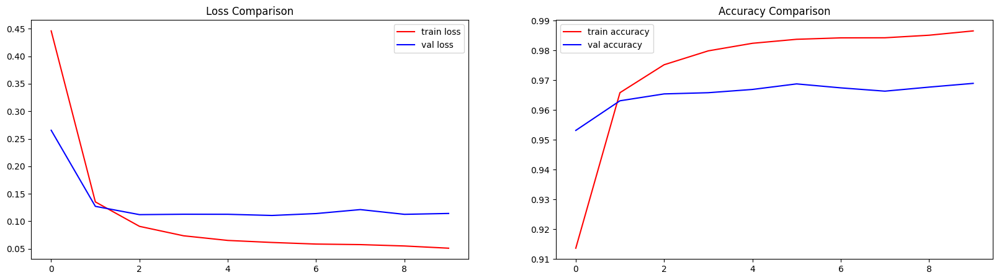

In [16]:
import matplotlib.pyplot as plt
fig, axis = plt.subplots(1, 2, figsize=(20, 5))
axis[0].plot(history1.history["loss"], color='r', label = 'train loss')
axis[0].plot(history1.history["val_loss"], color='b', label = 'val loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(history1.history["pixel_accuracy"], color='r', label = 'train accuracy')
axis[1].plot(history1.history["val_pixel_accuracy"], color='b', label = 'val accuracy')
axis[1].set_title('Accuracy Comparison')
axis[1].legend()

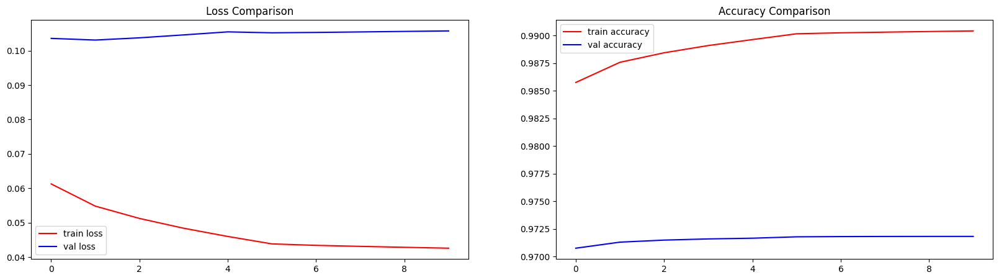

In [15]:
import matplotlib.pyplot as plt
fig, axis = plt.subplots(1, 2, figsize=(20, 5))
axis[0].plot(history2.history["loss"], color='r', label = 'train loss')
axis[0].plot(history2.history["val_loss"], color='b', label = 'val loss')
axis[0].set_title('Loss Comparison')
axis[0].legend()
axis[1].plot(history2.history["pixel_accuracy"], color='r', label = 'train accuracy')
axis[1].plot(history2.history["val_pixel_accuracy"], color='b', label = 'val accuracy')
axis[1].set_title('Accuracy Comparison')
axis[1].legend()

In [17]:
# Generate predictions for all images in the validation set
checkpoint_filepath = "deeplabv3_plus_v2_LaPa_seg.weights.h5"
model.load_weights(checkpoint_filepath)

import numpy as np

num_val = NUM_VAL_IMAGES
val_preds = np.zeros((num_val, IMAGE_SIZE, IMAGE_SIZE, NUM_CLASSES), dtype=np.float32)

i = 0
for images, masks in val_dataset:
    preds = model.predict(images, verbose=0)
    batch_size = preds.shape[0]
    val_preds[i:i+batch_size] = preds
    i += batch_size

In [16]:
import numpy as np

num_val = NUM_VAL_IMAGES
val_preds = np.zeros((num_val, IMAGE_SIZE, IMAGE_SIZE, NUM_CLASSES), dtype=np.float32)

i = 0
for images, masks in val_dataset:
    preds = model.predict(images, verbose=0)
    batch_size = preds.shape[0]
    val_preds[i:i+batch_size] = preds
    i += batch_size

In [17]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps

def visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.5):
    """
    Visualize predictions in a grid: original, GT mask, predicted mask, overlay.

    Args:
        val_input_img_paths: list of input image file paths
        val_target_img_paths: list of ground truth mask file paths
        val_preds: model predictions (numpy array)
        indices: list of indices to visualize (if None, random sample of 4)
        alpha: overlay transparency for prediction
    """
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]  # ensure iterable if only one row

    for row, i in enumerate(indices):
        # Load original image
        orig = np.array(Image.open(val_input_img_paths[i]))

        # Load GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))

        # Get predicted mask (argmax over channels)
        pred_mask = np.argmax(val_preds[i], axis=-1).astype(np.uint8)

        # Resize prediction to original image size
        pred_mask_resized = np.array(Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST))

        # Overlay prediction on original image
        overlay = orig.copy()
        overlay = (alpha * np.stack([pred_mask_resized]*3, axis=-1) * 50 + (1-alpha) * overlay).astype(np.uint8)

        # Plotting
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_mask, cmap="gray")
        axs[row][1].set_title("GT Mask")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_mask_resized, cmap="gray")
        axs[row][2].set_title("Pred Mask")
        axs[row][2].axis("off")

        axs[row][3].imshow(orig)
        axs[row][3].imshow(pred_mask_resized, cmap="jet", alpha=alpha)  # transparent overlay
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

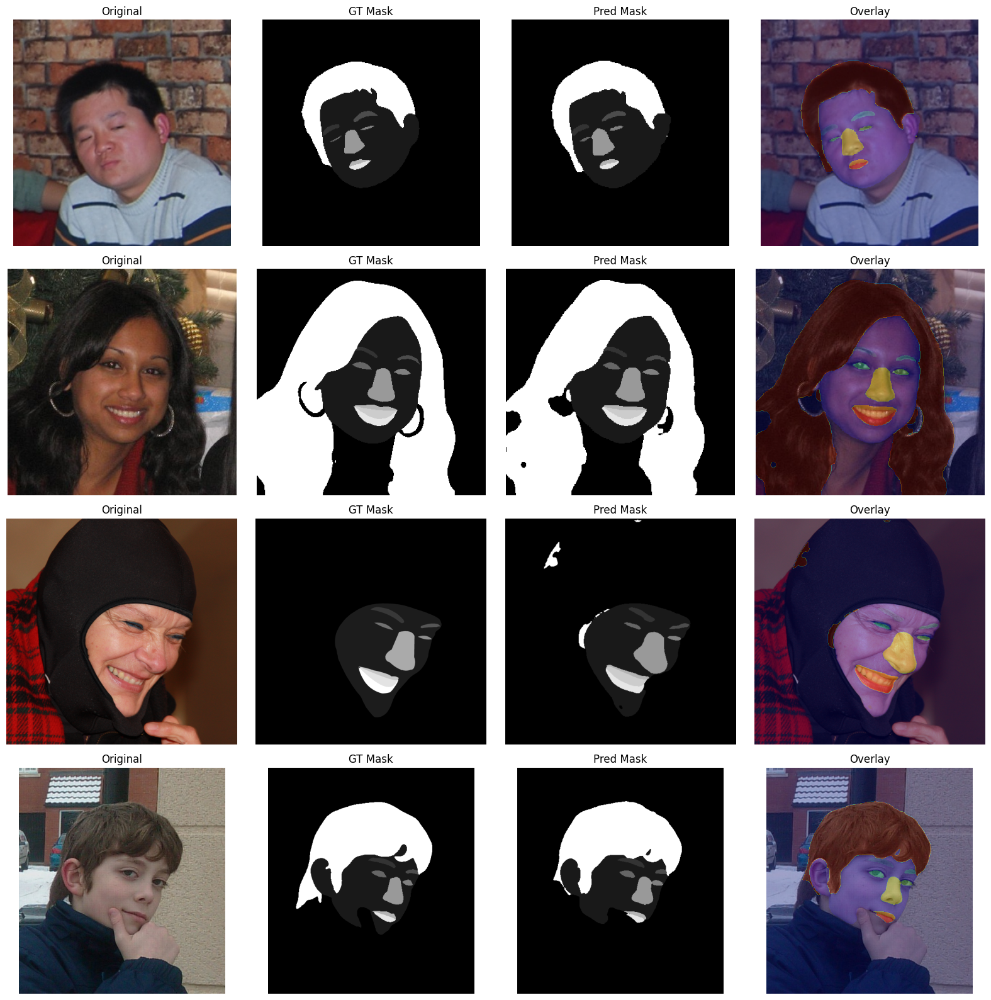

In [19]:
visualize_predictions(val_images, val_masks, val_preds, indices=None, alpha=0.3)

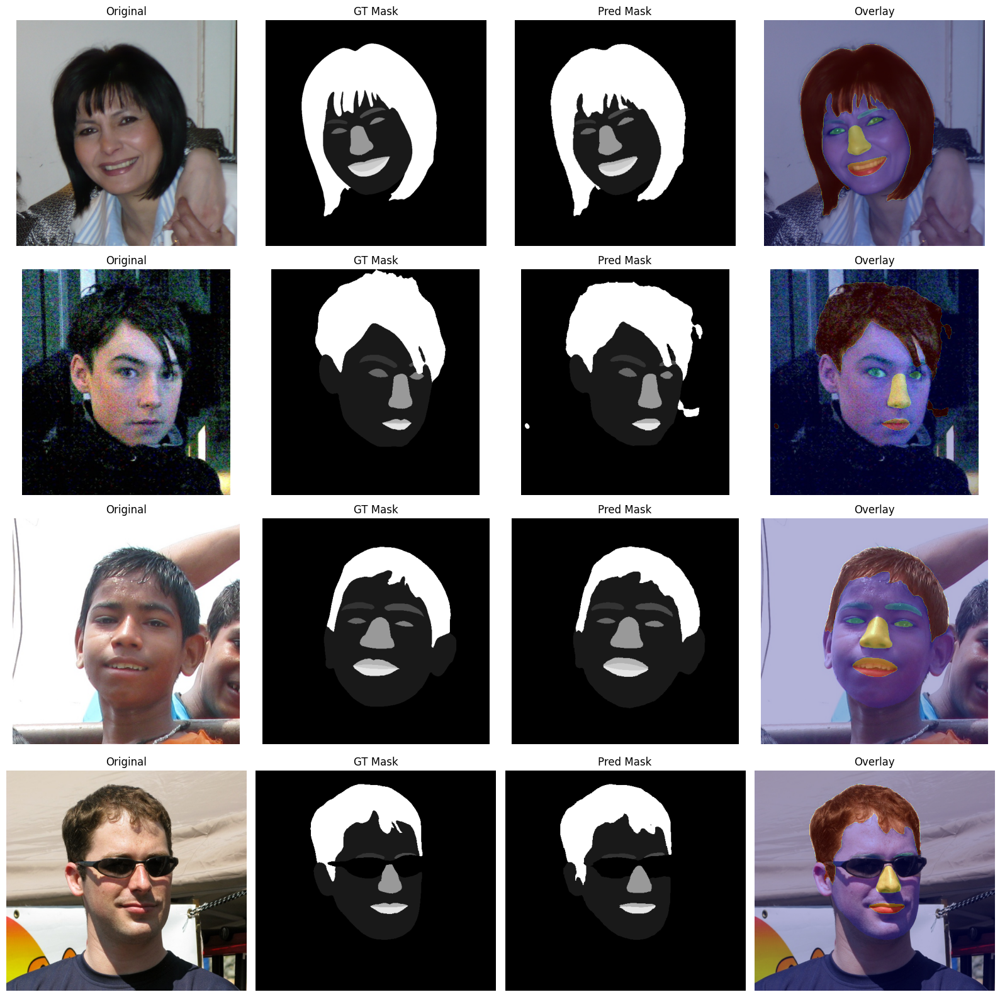

In [18]:
visualize_predictions(val_images, val_masks, val_preds, indices=None, alpha=0.3)

In [19]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

CATEGORY_COLORS = {
    0: [120, 120, 120],
    1: [180, 120, 120],
    2: [6, 230, 230],
    3: [80, 50, 50],
    4: [4, 200, 3],
    5: [140, 190, 214],
    6: [235, 255, 7],
    7: [204, 5, 255],
    8: [230, 230, 230],
    9: [230, 230, 230],
    10: [224, 5, 255],
    11: [150, 5, 61],
    12: [205, 165, 30],
    13: [8, 255, 51],
    14: [255, 6, 82],
    15: [143, 255, 140],
    16: [0, 0, 255],
    17: [255, 51, 7],
}

def decode_mask(mask, category_colors=CATEGORY_COLORS):
    """
    Convert class index mask -> RGB mask using category colors.
    """
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id, color in category_colors.items():
        rgb_mask[mask == cls_id] = color
    return rgb_mask

def visualize_predictions(val_input_img_paths, val_target_img_paths, val_preds, indices=None, alpha=0.5):
    """
    Visualize predictions in a grid: original, GT mask, predicted mask, overlay.

    Args:
        val_input_img_paths: list of input image file paths
        val_target_img_paths: list of ground truth mask file paths
        val_preds: model predictions (numpy array)
        indices: list of indices to visualize (if None, random sample of 4)
        alpha: overlay transparency for prediction
    """
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]

    for row, i in enumerate(indices):
        # Original image
        orig = np.array(Image.open(val_input_img_paths[i]))

        # GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))
        gt_mask_rgb = decode_mask(gt_mask)

        # Prediction
        pred_mask = np.argmax(val_preds[i], axis=-1).astype(np.uint8)
        pred_mask_resized = np.array(
            Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST)
        )
        pred_mask_rgb = decode_mask(pred_mask_resized)

        # Overlay
        overlay = ((1 - alpha) * orig + alpha * pred_mask_rgb).astype(np.uint8)

        # Plotting
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_mask_rgb)
        axs[row][1].set_title("GT Mask")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_mask_rgb)
        axs[row][2].set_title("Pred Mask")
        axs[row][2].axis("off")

        axs[row][3].imshow(overlay)
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

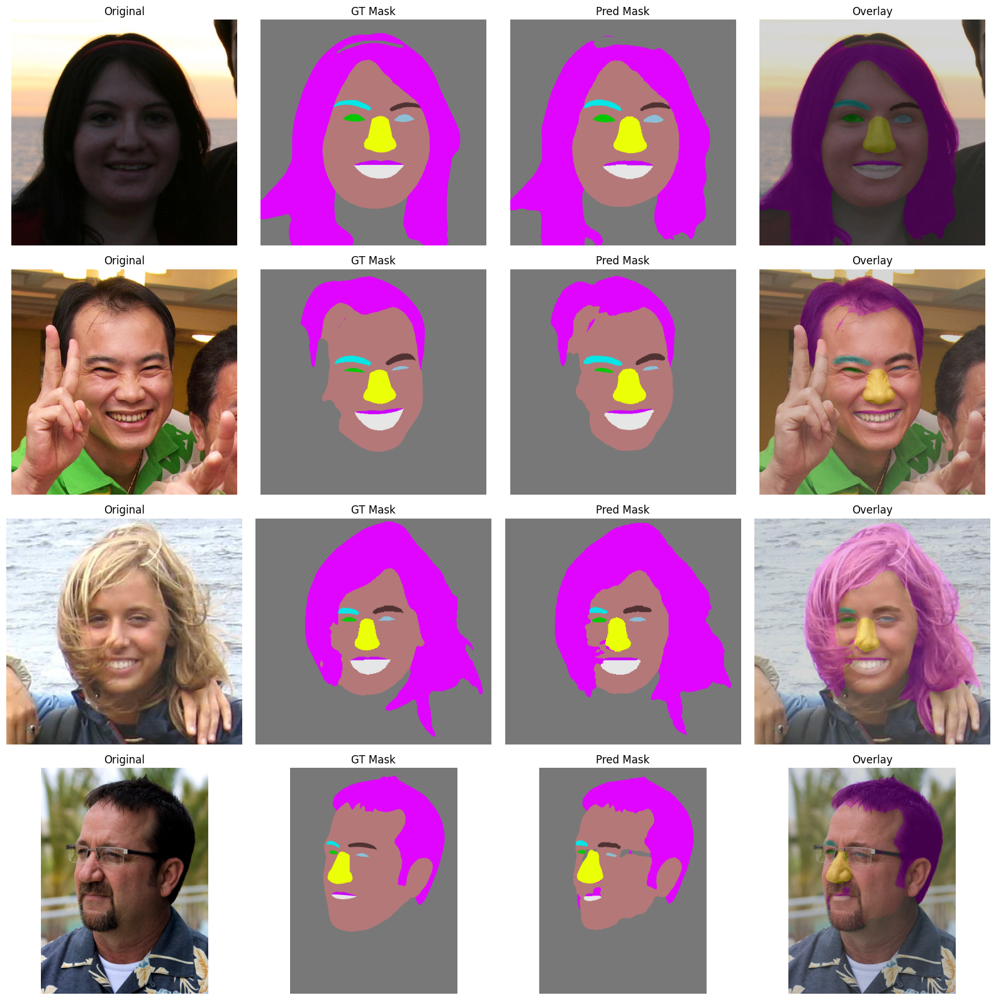

In [21]:
visualize_predictions(val_images, val_masks, val_preds, indices=None, alpha=0.3)

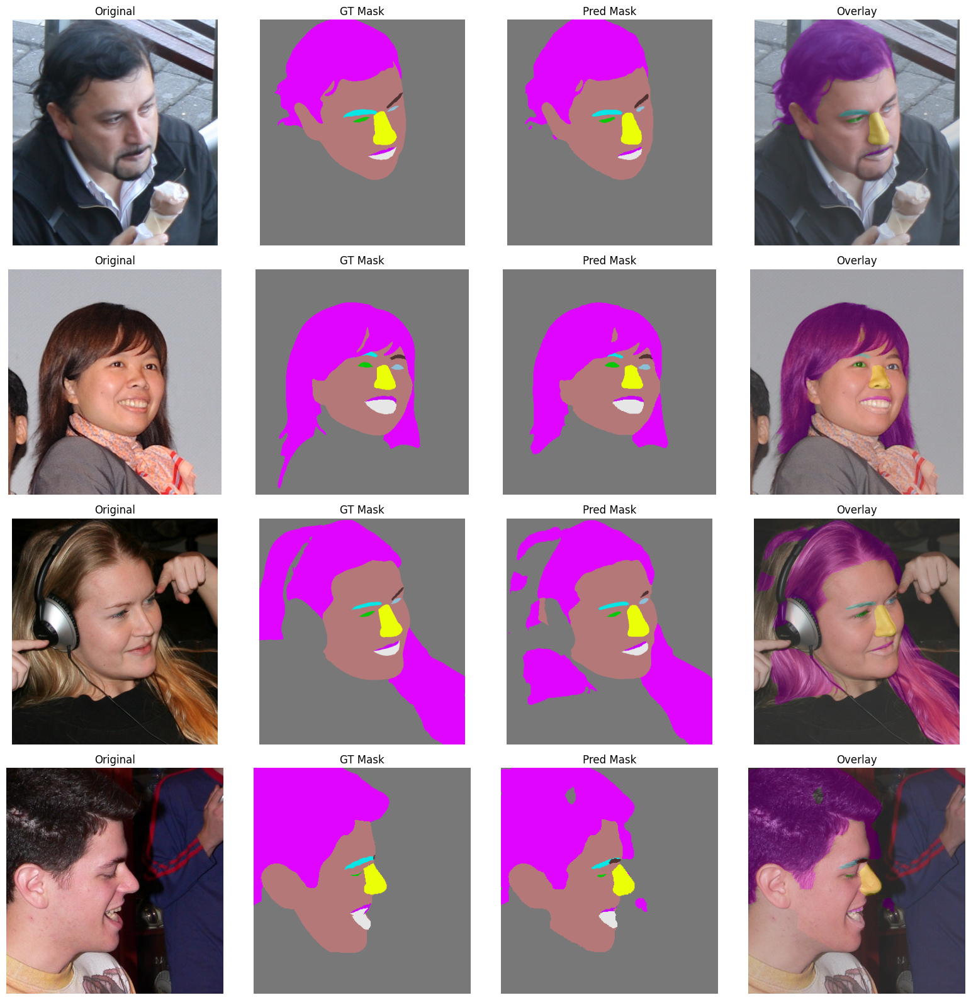

In [20]:
visualize_predictions(val_images, val_masks, val_preds, indices=None, alpha=0.3)

In [21]:
# Serialize the model as a SavedModel.
# Use model.export for Keras models
model.export("deeplabv3_plus_v2_LaPa_segmentation")

import tensorflow as tf
# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("deeplabv3_plus_v2_LaPa_segmentation")
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,  # Enable TensorFlow Lite ops.
    tf.lite.OpsSet.SELECT_TF_OPS,  # Enable TensorFlow ops.
]
tflite_model = converter.convert()
open("deeplabv3_plus_v2_LaPa_segmentation.tflite", "wb").write(tflite_model)

Saved artifact at 'deeplabv3_plus_v2_LaPa_segmentation'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 512, 512, 11), dtype=tf.float32, name=None)
Captures:
  137356842709456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756175184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756175952: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756176144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756173840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756174224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756178640: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756180176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756181136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137356756178832: TensorSpec(shape=(), dtype=tf.resourc

W0000 00:00:1758909745.396696     812 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1758909745.396755     812 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1758909745.539575     812 mlir_graph_optimization_pass.cc:401] MLIR V1 optimization pass is not enabled


18126320

In [22]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="deeplabv3_plus_v2_LaPa_segmentation.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Get input shape (batch, h, w, c)
input_shape = input_details[0]['shape'][1:3]

def preprocess_image(img_path, target_size):
    img = Image.open(img_path).convert("RGB").resize(target_size, Image.BILINEAR)
    arr = np.array(img, dtype=np.float32) #/ 255.0  # normalize if needed
    return arr

def run_tflite_inference(img_path):
    img = preprocess_image(img_path, tuple(input_shape))
    inp = np.expand_dims(img, axis=0)  # add batch dim

    # Run inference
    interpreter.set_tensor(input_details[0]['index'], inp)
    interpreter.invoke()
    output = interpreter.get_tensor(output_details[0]['index'])[0]

    # Convert to predicted mask
    pred_mask = np.argmax(output, axis=-1).astype(np.uint8)
    return pred_mask

def visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, indices=None, alpha=0.5):
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]

    for row, i in enumerate(indices):
        # Load original image
        orig = np.array(Image.open(val_input_img_paths[i]).convert("RGB"))

        # Load GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))

        # Run inference with TFLite
        pred_mask = run_tflite_inference(val_input_img_paths[i])

        # Resize predicted mask back to original image size
        pred_mask_resized = np.array(Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST))

        # Overlay
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_mask, cmap="gray")
        axs[row][1].set_title("GT Mask")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_mask_resized, cmap="gray")
        axs[row][2].set_title("Pred Mask")
        axs[row][2].axis("off")

        axs[row][3].imshow(orig)
        axs[row][3].imshow(pred_mask_resized, cmap="jet", alpha=alpha)
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


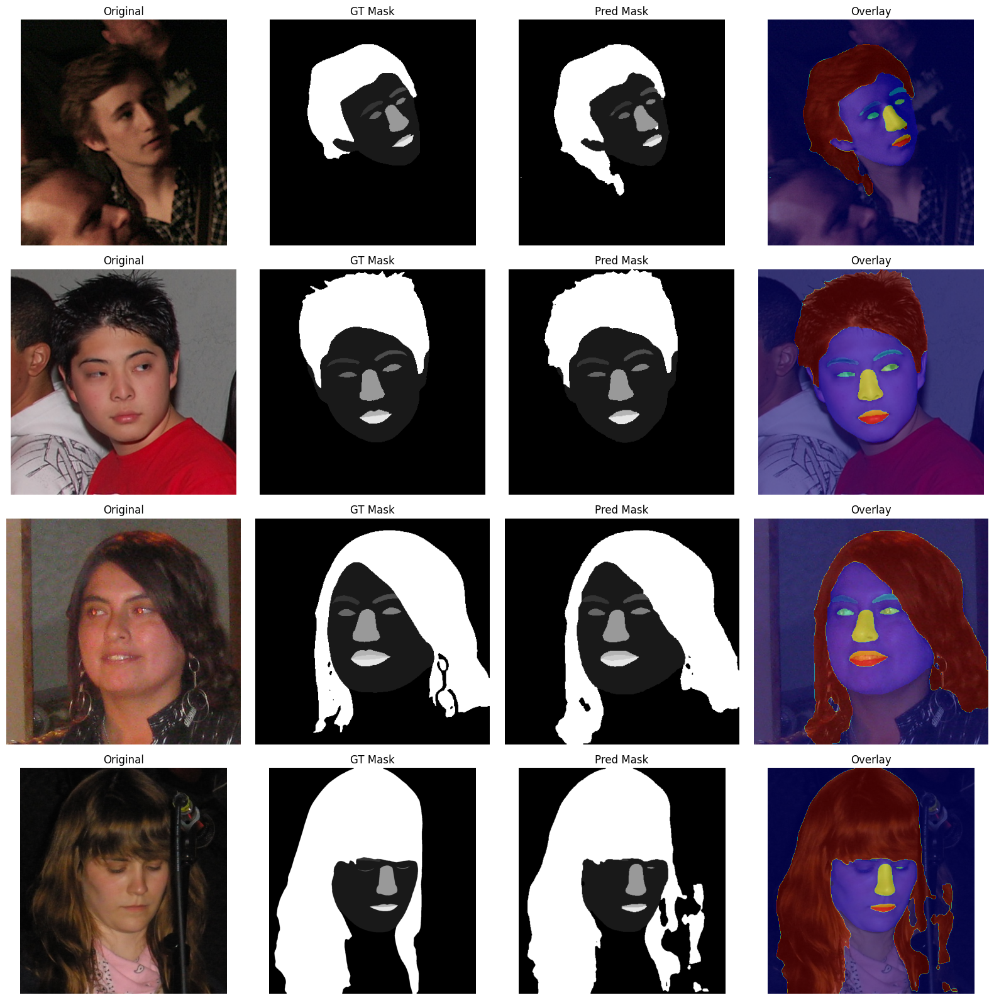

In [23]:
visualize_predictions_tflite(val_images, val_masks, alpha=0.5)

In [24]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="deeplabv3_plus_v2_LaPa_segmentation.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Get input shape (batch, h, w, c)
input_shape = input_details[0]['shape'][1:3]

CATEGORY_COLORS = {
    0: [0, 0, 0],
    1: [0, 153, 255],
    2: [102, 255, 153],
    3: [0, 204, 153],
    4: [255, 255, 102],
    5: [255, 255, 204],
    6: [255, 153, 0],
    7: [255, 102, 255],
    8: [102, 0, 51],
    9: [255, 204, 255],
    10: [255, 0, 102],
}

classes = [
    "background", "skin", "left eyebrow", "right eyebrow",
    "left eye", "right eye", "nose", "upper lip", "inner mouth",
    "lower lip", "hair"
]

def preprocess_image(img_path, target_size):
    img = Image.open(img_path).convert("RGB").resize(target_size, Image.BILINEAR)
    arr = np.array(img, dtype=np.float32)  # / 255.0  # normalize if needed
    return arr

def run_tflite_inference(img_path):
    img = preprocess_image(img_path, tuple(input_shape))
    inp = np.expand_dims(img, axis=0)  # add batch dim

    # Run inference
    interpreter.set_tensor(input_details[0]['index'], inp)
    interpreter.invoke()
    output = interpreter.get_tensor(output_details[0]['index'])[0]

    # Convert to predicted mask
    pred_mask = np.argmax(output, axis=-1).astype(np.uint8)
    return pred_mask

def decode_segmentation_mask(mask):
    """Map each label in mask to RGB color."""
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for label, color in CATEGORY_COLORS.items():
        color_mask[mask == label] = color
    return color_mask

def visualize_predictions_tflite(val_input_img_paths, val_target_img_paths, indices=None, alpha=0.5):
    if indices is None:
        indices = np.random.choice(len(val_input_img_paths), size=4, replace=False)

    n = len(indices)
    fig, axs = plt.subplots(n, 4, figsize=(16, 4*n))

    if n == 1:
        axs = [axs]

    for row, i in enumerate(indices):
        # Load original image
        orig = np.array(Image.open(val_input_img_paths[i]).convert("RGB"))

        # Load GT mask
        gt_mask = np.array(Image.open(val_target_img_paths[i]))
        gt_color = decode_segmentation_mask(gt_mask)

        # Run inference with TFLite
        pred_mask = run_tflite_inference(val_input_img_paths[i])

        # Resize predicted mask back to original image size
        pred_mask_resized = np.array(
            Image.fromarray(pred_mask).resize(orig.shape[1::-1], resample=Image.NEAREST)
        )
        pred_color = decode_segmentation_mask(pred_mask_resized)

        # Overlay prediction on original image
        overlay = ((1 - alpha) * orig + alpha * pred_color).astype(np.uint8)

        # Plotting
        axs[row][0].imshow(orig)
        axs[row][0].set_title("Original")
        axs[row][0].axis("off")

        axs[row][1].imshow(gt_color)
        axs[row][1].set_title("GT Mask (Color)")
        axs[row][1].axis("off")

        axs[row][2].imshow(pred_color)
        axs[row][2].set_title("Pred Mask (Color)")
        axs[row][2].axis("off")

        axs[row][3].imshow(overlay)
        axs[row][3].set_title("Overlay")
        axs[row][3].axis("off")

    plt.tight_layout()
    plt.show()

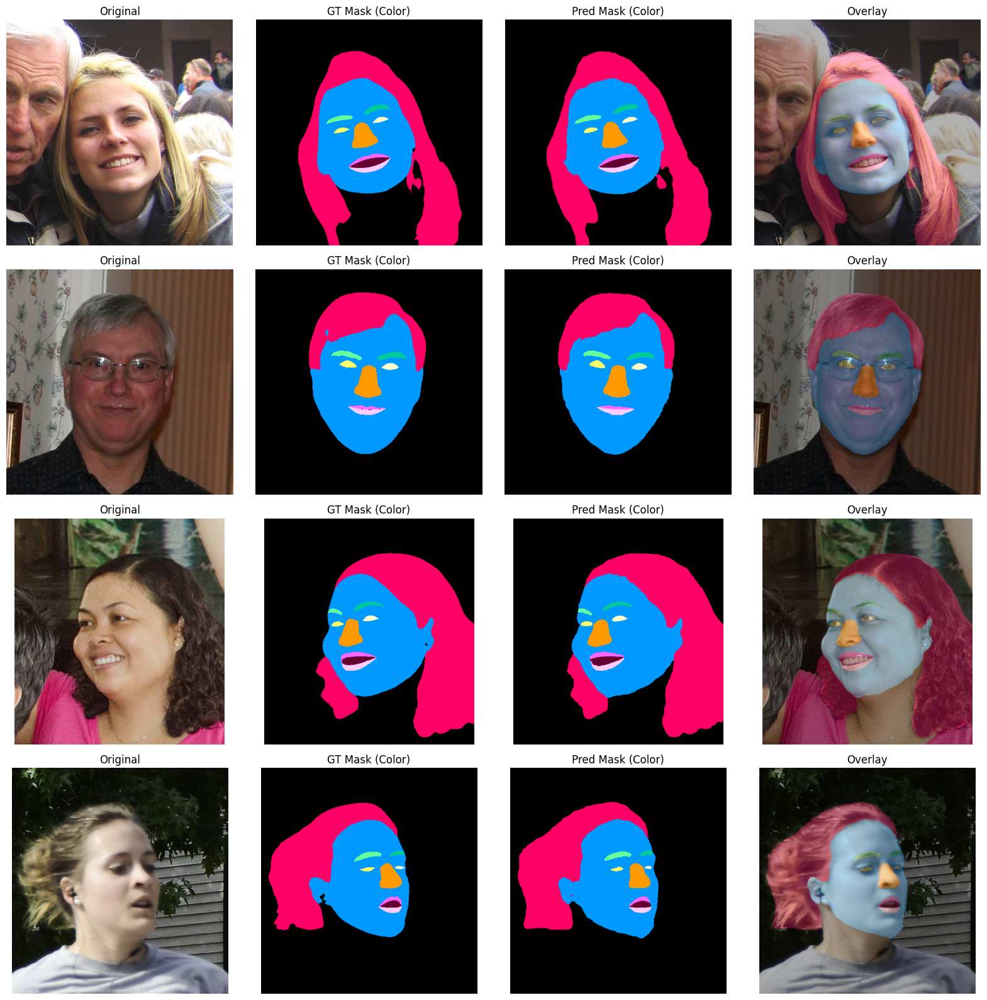

In [25]:
visualize_predictions_tflite(train_images, train_masks, alpha=0.3)

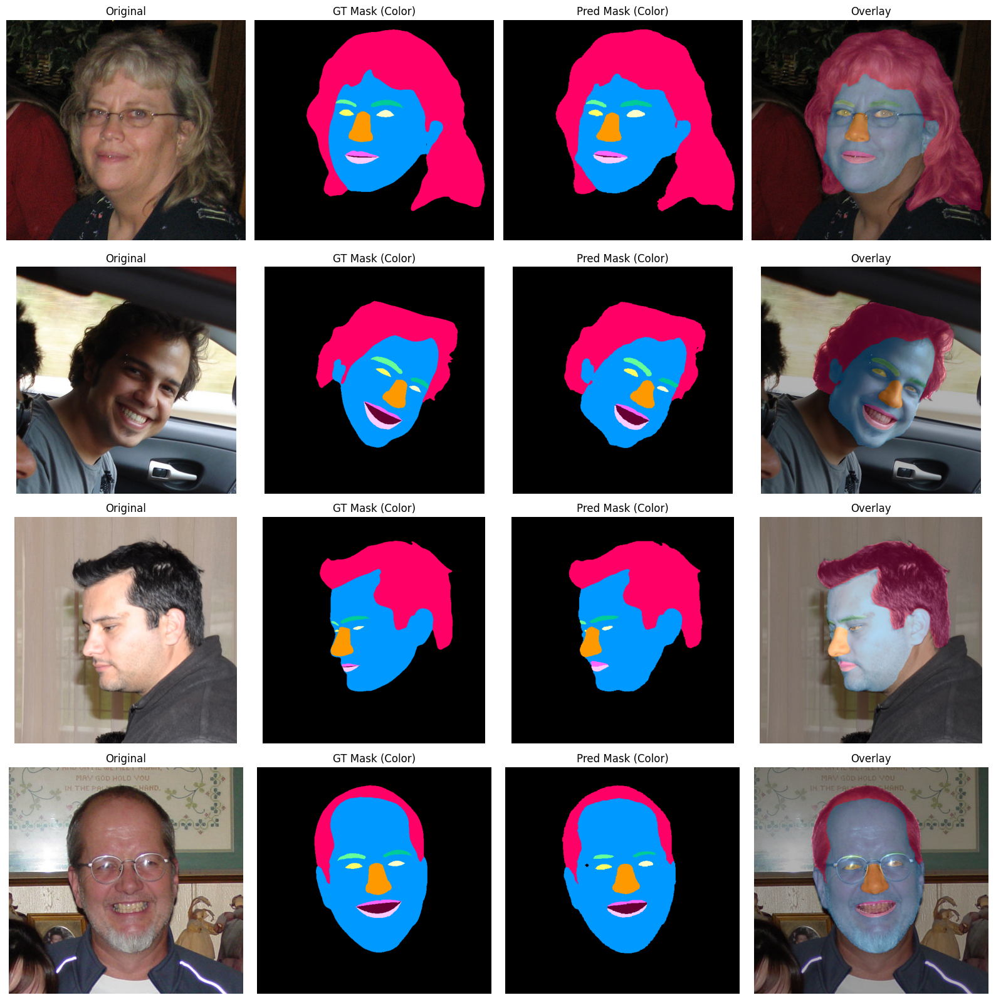

In [28]:
visualize_predictions_tflite(val_images, val_masks, alpha=0.3)

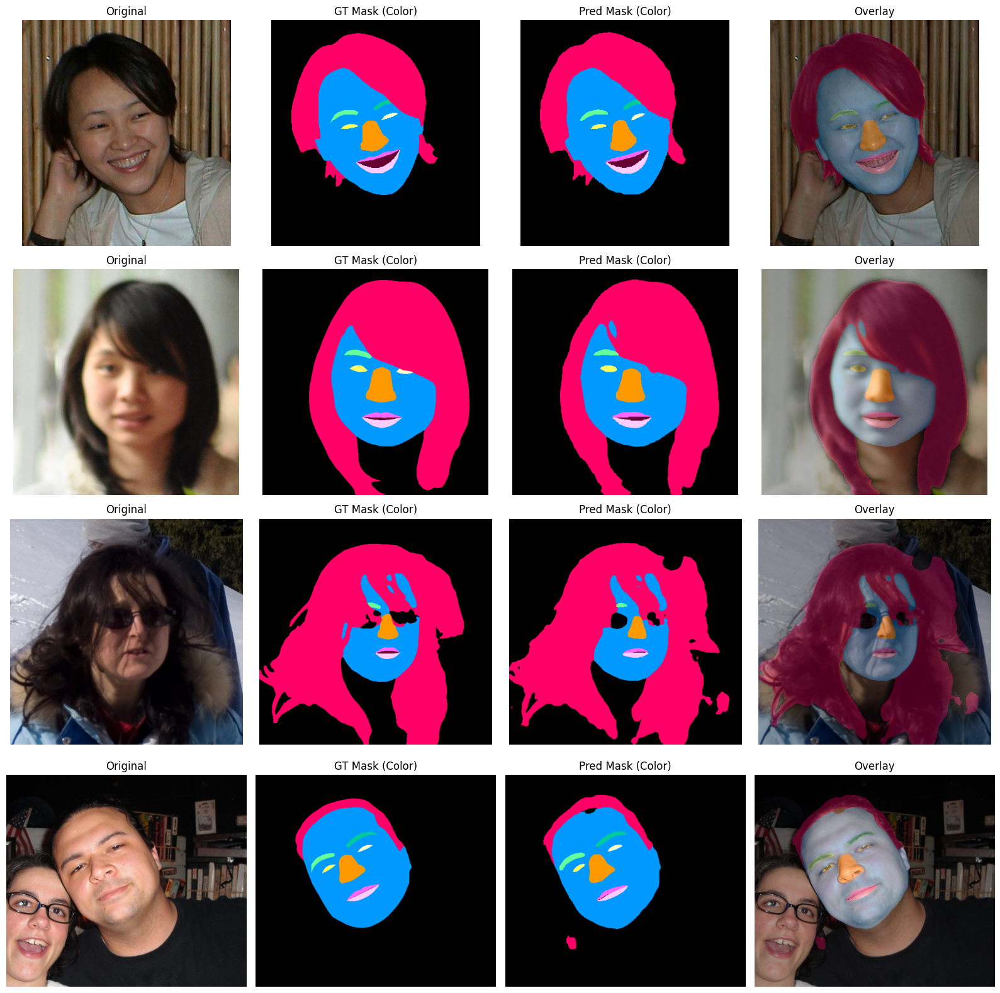

In [30]:
visualize_predictions_tflite(val_images, val_masks, alpha=0.3)